In [162]:
# import useful packages
import requests
from bs4 import BeautifulSoup
import pandas as pd
from selenium import webdriver
from webdriver_manager.chrome import ChromeDriverManager
import datetime
from datetime import datetime
import time
headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_3) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/13.0.5 Safari/605.1.15'}

In [364]:
url = 'https://www.amazon.com/s?k=hand+wash+soap&page=5&qid=1599696592&ref=sr_pg_5'

In [ ]:
# setting up the chrome driver
driver = webdriver.Chrome('/Users/guopinjie/Downloads/chromedriver')

In [164]:
# create list_ to store product info
list_ = []
# create reviews to store review info
reviews = []
# create two time point to make conditions to the review date
import datetime
date1 = datetime.datetime(2020,2,1)
date2 = datetime.datetime(2019,7,1)

In [365]:
# direct chrome to web page in the url
driver.get(url)
time.sleep(3)
# search element list which stores product info
results = driver.find_elements_by_xpath("//div[@data-component-type='s-search-result']")
# loop through each product to get info
for i in range(len(results)):
    result = results[i]
    new_url = result.find_elements_by_xpath(".//h2/a")[0].get_attribute('href')
    # direct drive to product detail page
    driver.get(new_url)
    # scrape basic info for each product
    dict_ = dict()
    dict_['name'] = driver.find_elements_by_xpath("//span[@id='productTitle']")[0].text.strip()
    dict_['url'] = new_url
    try:
        dict_['price'] = float(driver.find_elements_by_xpath("//span[@id='priceblock_ourprice']")[0].text.split('$')[1])
    except:
        pass
    list_.append(dict_)
    time.sleep(2)
    # get product review
    try:
        review_url = driver.find_elements_by_xpath("//a[@class='a-link-emphasis a-text-bold']")[0].get_attribute('href') + '&sortBy=recent&pageNumber=1'
        # direct to product review page
        driver.get(review_url)
        while True:
            # search element list which stores review info
            review_list = driver.find_elements_by_xpath("//div[@class='a-section review aok-relative']")
            # get review detail
            for review in review_list:
                review_dict = {}
                review_dict['name'] = dict_['name']
                date = ' '.join(review.find_elements_by_xpath(".//div[@class='a-section celwidget']/span")[-1].text.split(' ')[-3:])
                # transfer date to standard mode to compare them
                from datetime import datetime
                review_dict['date'] = datetime.strptime(date, '%B %d, %Y')
                # set review label as 1 if review date is between (2020,2,1) - now (before covid)
                if review_dict['date'] >= date1:
                    review_dict['label'] = 1
                # set review label as 0 if review date is between (2019,7,1) - (2020,2,1) (after covid)
                elif review_dict['date'] <= date1 and review_dict['date'] >= date2:
                    review_dict['label'] = 0
                # stop scraping if review is out of the time range
                else:
                    break
                try:
                    review_dict['rating'] = float(review.find_elements_by_xpath(".//div[@class='a-row']/a[@class='a-link-normal']")[0].get_attribute('title').split(' ')[0])
                except:
                    pass
                text_title = review.find_elements_by_xpath(".//div[@class='a-row']")[0].text
                text_content = review.find_elements_by_xpath(".//div[@class='a-row a-spacing-small review-data']/span")[0].text
                try:
                    review_dict['text'] = text_title + ' ' + text_content
                except:
                    review_dict['text'] = text_content
                reviews.append(review_dict)
            if review_dict['date'] <= date2:
                break
            else:
                # click the next page button in the website to let driver direct to the next review page; if there is no next page, break
                try:
                    driver.find_elements_by_xpath(".//li[@class='a-last']")[0].click()
                    time.sleep(5)
                except:
                    break
    except:
        pass
    # after scraping reviews, return back to the main page
    driver.get(url)
    time.sleep(3)
    results = driver.find_elements_by_xpath("//div[@data-component-type='s-search-result']")

In [366]:
list_

[{'name': 'Caldrea Hand Wash Soap, Aloe Vera Gel, Olive Oil and Essential Oils to Cleanse and Condition, Sweet Pea Scent, 10.8 oz',
  'url': 'https://www.amazon.com/gp/slredirect/picassoRedirect.html/ref=pa_sp_atf_aps_sr_pg1_1?ie=UTF8&adId=A03634252ZMUTZ187CKTI&url=%2FCaldrea-Hand-Soap-Sweet-Pea%2Fdp%2FB01AIX9Y96%2Fref%3Dsr_1_1_sspa%3Fdchild%3D1%26keywords%3Dhand%2Bwash%2Bsoap%26qid%3D1599671763%26sr%3D8-1-spons%26psc%3D1&qualifier=1599671763&id=5384529593329551&widgetName=sp_atf',
  'price': 16.89},
 {'name': 'Everyone 3-in-1 Kids Soap: Shampoo, Body Wash, and Bubble Bath, Orange Squeeze, 32 Ounce, 2 Count',
  'url': 'https://www.amazon.com/gp/slredirect/picassoRedirect.html/ref=pa_sp_atf_aps_sr_pg1_1?ie=UTF8&adId=A02356468WJN08MIJWLA&url=%2FEveryone-3-1-Kids-Soap%2Fdp%2FB08167KP4C%2Fref%3Dsr_1_2_sspa%3Fdchild%3D1%26keywords%3Dhand%2Bwash%2Bsoap%26qid%3D1599671774%26sr%3D8-2-spons%26psc%3D1&qualifier=1599671773&id=8481500685453338&widgetName=sp_atf',
  'price': 19.36},
 {'name': "Mrs.

In [367]:
len(list_)

264

In [319]:
reviews

In [253]:
# function for getting reviews for one product in case that any product's review hasn't been scraped accidently
def get_reviews(review_url):
    reviews0 = []
    driver.get(review_url)
    time.sleep(5)
    while True:
        review_list = driver.find_elements_by_xpath("//div[@class='a-section review aok-relative']")
        for review in review_list:
            review_dict = {}
            review_dict['name'] = dict_['name']
            date = ' '.join(review.find_elements_by_xpath(".//div[@class='a-section celwidget']/span")[-1].text.split(' ')[-3:])
            from datetime import datetime
            review_dict['date'] = datetime.strptime(date, '%B %d, %Y')
            if review_dict['date'] >= date1:
                review_dict['label'] = 1
            elif review_dict['date'] <= date1 and review_dict['date'] >= date2:
                review_dict['label'] = 0
            else:
                break
            review_dict['rating'] = float(review.find_elements_by_xpath(".//div[@class='a-row']/a[@class='a-link-normal']")[0].get_attribute('title').split(' ')[0])
            text_title = review.find_elements_by_xpath(".//div[@class='a-row']")[0].text
            text_content = review.find_elements_by_xpath(".//div[@class='a-row a-spacing-small review-data']/span")[0].text
            try:
                review_dict['text'] = text_title + ' ' + text_content
            except:
                review_dict['text'] = text_content
            reviews0.append(review_dict)
        if review_dict['date'] <= date2:
            break
        else:
            try:
                driver.find_elements_by_xpath(".//li[@class='a-last']")[0].click()
                time.sleep(5)
            except:
                break
    return reviews0

In [273]:
review_url = 'https://www.amazon.com/Safeguard-Liquid-Bacteria-Micellar-Cleansing/product-reviews/B0876WBJKX/ref=cm_cr_dp_d_show_all_btm?ie=UTF8&reviewerType=all_reviews&sortBy=recent&pageNumber=1'

In [306]:
reviews0 = get_reviews(review_url)

In [307]:
reviews0

[{'name': 'Botanic Hearth Tea Tree Liquid Hand Soap - Sulfate Free Formula - Multi Purpose Hand Wash with Aloe Vera and Therapeutic Grade Tea Tree Oil, Pump Dispenser - 16 fl oz',
  'date': datetime.datetime(2020, 9, 6, 0, 0),
  'label': 1,
  'rating': 5.0,
  'text': 'Love it Smells like heaven.'},
 {'name': 'Botanic Hearth Tea Tree Liquid Hand Soap - Sulfate Free Formula - Multi Purpose Hand Wash with Aloe Vera and Therapeutic Grade Tea Tree Oil, Pump Dispenser - 16 fl oz',
  'date': datetime.datetime(2020, 9, 4, 0, 0),
  'label': 1,
  'rating': 5.0,
  'text': 'Pricey But Great The soap foams up so nicely and smells great. And the packing is super chic.'},
 {'name': 'Botanic Hearth Tea Tree Liquid Hand Soap - Sulfate Free Formula - Multi Purpose Hand Wash with Aloe Vera and Therapeutic Grade Tea Tree Oil, Pump Dispenser - 16 fl oz',
  'date': datetime.datetime(2020, 9, 3, 0, 0),
  'label': 1,
  'rating': 3.0,
  'text': "If you don't like strong scents, this one is not for you. scent w

In [276]:
reviews.extend(reviews0)

In [368]:
# turn product info list into dataframe
df = pd.DataFrame(list_)
df

,name,url,price
0,"Caldrea Hand Wash Soap, Aloe Vera Gel, Olive O...",https://www.amazon.com/gp/slredirect/picassoRe...,16.89
1,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",https://www.amazon.com/gp/slredirect/picassoRe...,19.36
2,"Mrs. Meyer's Clean Day Liquid Hand Soap, Cruel...",https://www.amazon.com/Mrs-Meyers-Clean-Day-La...,11.37
3,Amazon Brand - Solimo Original Fresh Liquid Ha...,https://www.amazon.com/Amazon-Brand-Solimo-Ori...,9.21
4,"Orange and Bergamot Hand Wash, 10 Fl Oz",https://www.amazon.com/Orange-and-Bergamot-Han...,30.00
...,...,...,...
259,Hand Soap/8.5 oz.,https://www.amazon.com/Hand-Soap-8-5-oz/dp/B07...,49.90
260,"UNKNOWN Deep steep argan oil liquid hand wash,...",https://www.amazon.com/Deep-Steep-Argan-Liquid...,6.95
261,Natural Moisturizing Liquid Handwash by DANI N...,https://www.amazon.com/Natural-Moisturizing-Ha...,18.00
262,COOLINKO Antibacterial Hand Soap - Aloe Liquid...,https://www.amazon.com/gp/slredirect/picassoRe...,7.95


In [580]:
# store it in csv
df.to_csv('product_info.csv')

In [390]:
# turn product review into dataframe
review_df = pd.DataFrame(reviews)

In [391]:
review_df

,name,date,label,rating,text
0,"Caldrea Hand Wash Soap, Aloe Vera Gel, Olive O...",2020-07-25,1,5.0,Worth the money! Just love this handwash!
1,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-09-06,1,5.0,Good to try!!! We love this brand!
2,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-08-31,1,2.0,Not really for bubble baths My little ones lov...
3,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-08-28,1,5.0,"Simple. Clean. We absolutely love this soap, m..."
4,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-07-20,1,5.0,Great soap and bargain! Great soap for kids. M...
...,...,...,...,...,...
26200,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-26,1,5.0,Great product The product is great! A little a...
26201,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-14,1,5.0,Great product. Product works very good and sme...
26202,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-14,1,5.0,CO Bigelow LEMON is awesome The soap itself is...
26203,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-12,1,5.0,Great customer service Great product and excel...


In [392]:
# drop duplicate reviews
review_df.drop_duplicates(keep = 'first', inplace = True)

In [393]:
review_df.reset_index(inplace=True,drop=True)

In [394]:
review_df

,name,date,label,rating,text
0,"Caldrea Hand Wash Soap, Aloe Vera Gel, Olive O...",2020-07-25,1,5.0,Worth the money! Just love this handwash!
1,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-09-06,1,5.0,Good to try!!! We love this brand!
2,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-08-31,1,2.0,Not really for bubble baths My little ones lov...
3,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-08-28,1,5.0,"Simple. Clean. We absolutely love this soap, m..."
4,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-07-20,1,5.0,Great soap and bargain! Great soap for kids. M...
...,...,...,...,...,...
10350,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-26,1,5.0,Great product The product is great! A little a...
10351,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-14,1,5.0,Great product. Product works very good and sme...
10352,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-14,1,5.0,CO Bigelow LEMON is awesome The soap itself is...
10353,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-12,1,5.0,Great customer service Great product and excel...


In [581]:
# store it in csv
review_df.to_csv('product_review.csv')

In [395]:
# get reviews before covid19
review_df_0 = review_df[review_df['label'] == 0]

In [397]:
# get reviews after covid19
review_df_1 = review_df[review_df['label'] == 1]

In [398]:
## contrast the review number before and after covid 19
print(len(review_df_0))
print(len(review_df_1))

2309
8046


In [405]:
### draw a pie chart
import plotly.graph_objects as go

labels = ['before_covid','after_covid']
values = [2309,8046]

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.show()

In [417]:
## contrast the rating value before and after covid 19
review_rating = review_df_0[['rating','label']].append(review_df_1[['rating','label']])

In [419]:
### draw a violin plot
import plotly.express as px

fig = px.violin(review_rating, y="rating", color="label",
                violinmode='overlay', # draw violins on top of each other
                # default violinmode is 'group' as in example above
                hover_data=review_rating.columns)
fig.show()

In [452]:
## contrast wordcloud
from wordcloud import WordCloud, STOPWORDS 
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import string
import matplotlib
from matplotlib import pyplot as plt

# make data preprocessing on the original review to remove stop words and change each word to their stem
def preprocess_data(raw_text):
    texts = []
    stop_words = set(stopwords.words('english')) 
    p_stemmer = PorterStemmer()
    for i in raw_text:
        if type(i) == str:
            word_tokens = word_tokenize(i.lower().strip().translate(str.maketrans('', '', string.punctuation)))
            #remove stop words
            stopped_tokens = [i for i in word_tokens if not i in stop_words]
            # change each word to their stem
            stemmed_tokens = [p_stemmer.stem(i) for i in stopped_tokens]
            texts.append(stemmed_tokens)
        else:
            continue
    return texts

In [453]:
# function to draw wordcloud
def get_wordcloud(delete_words, text_list):
    # raw text preprocessing
    clean_text = preprocess_data(text_list)
    text = ','.join([','.join(item) for item in clean_text])
    # Remove unwanted words
    for word in delete_words:
        text = text.replace(word,' ')
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color='white',width=4000,height=4000,max_words=50).generate(text)
    # plot WordCloud
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

In [482]:
import string

In [488]:
# get the 50 most common words in reviews before covid
from collections import Counter
Review_0 = preprocess_data(list(review_df_0['text']))
Review_list = []
for i in Review_0:
    Review_list.extend(i)
c = Counter(Review_list)
c.most_common(50)

[('soap', 1866),
 ('hand', 1335),
 ('smell', 1151),
 ('scent', 1030),
 ('great', 1022),
 ('love', 1021),
 ('product', 705),
 ('good', 676),
 ('like', 574),
 ('use', 550),
 ('’', 466),
 ('clean', 405),
 ('bottl', 399),
 ('nice', 330),
 ('dri', 296),
 ('one', 267),
 ('feel', 251),
 ('skin', 249),
 ('wash', 245),
 ('price', 234),
 ('buy', 231),
 ('refil', 228),
 ('well', 218),
 ('work', 197),
 ('realli', 188),
 ('get', 186),
 ('moistur', 176),
 ('meyer', 160),
 ('would', 159),
 ('valu', 150),
 ('much', 147),
 ('pump', 144),
 ('doesnt', 142),
 ('time', 140),
 ('best', 135),
 ('dispens', 134),
 ('help', 134),
 ('purchas', 132),
 ('mr', 131),
 ('order', 125),
 ('strong', 123),
 ('make', 120),
 ('amaz', 119),
 ('foam', 118),
 ('leak', 116),
 ('wonder', 114),
 ('favorit', 112),
 ('fragranc', 111),
 ('liquid', 109),
 ('bathroom', 107)]

In [490]:
# get the 50 most common words in reviews after covid
from collections import Counter
Review_1 = preprocess_data(list(review_df_1['text']))
Review_list = []
for i in Review_1:
    Review_list.extend(i)
c = Counter(Review_list)
c.most_common(50)

[('soap', 7048),
 ('hand', 5474),
 ('smell', 3875),
 ('scent', 3202),
 ('great', 3111),
 ('product', 2774),
 ('love', 2526),
 ('good', 2476),
 ('like', 2281),
 ('’', 2029),
 ('use', 1870),
 ('bottl', 1779),
 ('wash', 1424),
 ('nice', 1403),
 ('clean', 1340),
 ('feel', 1154),
 ('dri', 1116),
 ('well', 1022),
 ('buy', 935),
 ('skin', 876),
 ('one', 874),
 ('work', 871),
 ('price', 857),
 ('realli', 812),
 ('get', 804),
 ('time', 774),
 ('foam', 749),
 ('would', 707),
 ('pump', 687),
 ('dispens', 660),
 ('refil', 651),
 ('lather', 643),
 ('moistur', 630),
 ('packag', 609),
 ('order', 604),
 ('soft', 556),
 ('much', 550),
 ('leav', 539),
 ('leak', 529),
 ('liquid', 509),
 ('brand', 505),
 ('littl', 493),
 ('valu', 492),
 ('make', 487),
 ('purchas', 486),
 ('doesnt', 468),
 ('need', 444),
 ('strong', 430),
 ('also', 421),
 ('tri', 420)]

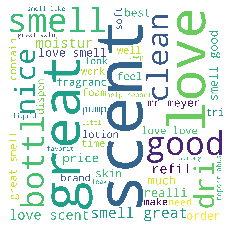

In [491]:
Review_0 = list(review_df_0['text'])
# find the most common confusing words in reviews before covid and put them into delete words list
delete_words = ['soap', 'hand', 'product', '’', 'use', 'wash', 'packag', 'buy', 'one', 'would', 'purchas', 'doesnt', 'also']
get_wordcloud(delete_words, Review_0)

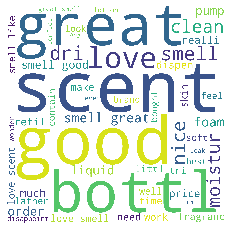

In [492]:
Review_1 = list(review_df_1['text'])
# find the most common confusing words in reviews after covid and put them into delete words list
delete_words = ['soap', 'hand', 'product', '’', 'use', 'wash', 'packag', 'buy', 'one', 'would', 'purchas', 'doesnt', 'also']
get_wordcloud(delete_words, Review_1)

In [503]:
## contrast noun chunks frequency
# remove confusing words
delete_words = ['soap', 'hand', 'product', '’', 'use', 'wash', 'packag', 'buy', 'one', 'would', 'purchas', 'doesnt', 'also', 'report']
import spacy
# set up nlp environment in spacy
nlp = spacy.load("en_core_web_sm")
# use spacy to identify each chunk in the review before covid and put them into the chunk list
chunk_list = []
for text in Review_0:
    doc = nlp(text.lower())
    for chunk in doc.noun_chunks:
        chunk = ' '.join([word for word in str(chunk.text).split() if word not in STOPWORDS])
        if not (len(chunk.split(' ')) == 0 or len(chunk.split(' ')) == 1):
            chunk_list.append(chunk)
# create chunk dict to record each chunk's appearence time
chunk_dict = dict()
for i in chunk_list:
    if not set.intersection(set(i.lower().split(' ')), set(delete_words)):
        if chunk_dict.get(i):
            chunk_dict[i] += 1
        else:
            chunk_dict[i] = 1
# sort chunk dict based on the value
sort_list = sorted(chunk_dict.items(), key=lambda x: x[1], reverse=True)

In [505]:
# draw bubble chart for the most ten frequency chunks
import plotly.graph_objects as go
x_data = list(range(10))
y_data = list(zip(*sort_list))[1][:10]
z_data = list(zip(*sort_list))[0][:10]
annotations = [
    dict(
        x=x_data[i], 
        y=y_data[i],
        text=z_data[i], # Some conditional to define outliers
        showarrow=False,
        xanchor='center',  # Position of text relative to x axis (left/right/center)
        yanchor='top' if i%2 else 'bottom',  # Position of text relative to y axis (top/bottom/middle)
    ) for i in range(10)
]
trace0 = go.Scatter(
    x=x_data,
    y=y_data,
    mode='markers',
    marker=dict(
        size=[i for i in y_data],
    )
)

data = [trace0]
layout = go.Layout(annotations=annotations)

fig = go.Figure(data=data, layout=layout)
fig.show()

In [506]:
# remove confusing words
delete_words = ['soap', 'hand', 'product', '’', 'use', 'wash', 'packag', 'buy', 'one', 'would', 'purchas', 'doesnt', 'also', 'report']
import spacy
# set up nlp environment in spacy
nlp = spacy.load("en_core_web_sm")
# use spacy to identify each chunk in the review after covid and put them into the chunk list
chunk_list = []
for text in Review_1:
    doc = nlp(text.lower())
    for chunk in doc.noun_chunks:
        chunk = ' '.join([word for word in str(chunk.text).split() if word not in STOPWORDS])
        if not (len(chunk.split(' ')) == 0 or len(chunk.split(' ')) == 1):
            chunk_list.append(chunk)
# create chunk dict to record each chunk's appearence time
chunk_dict = dict()
for i in chunk_list:
    if not set.intersection(set(i.lower().split(' ')), set(delete_words)):
        if chunk_dict.get(i):
            chunk_dict[i] += 1
        else:
            chunk_dict[i] = 1
# sort chunk dict based on the value
sort_list = sorted(chunk_dict.items(), key=lambda x: x[1], reverse=True)

In [509]:
# draw bubble chart for the most ten frequency chunks
import plotly.graph_objects as go
x_data = list(range(10))
y_data = list(zip(*sort_list))[1][:10]
z_data = list(zip(*sort_list))[0][:10]
annotations = [
    dict(
        x=x_data[i], 
        y=y_data[i],
        text=z_data[i], # Some conditional to define outliers
        showarrow=False,
        xanchor='center',  # Position of text relative to x axis (left/right/center)
        yanchor='top' if i%2 else 'bottom',  # Position of text relative to y axis (top/bottom/middle)
    ) for i in range(10)
]
trace0 = go.Scatter(
    x=x_data,
    y=y_data,
    mode='markers',
    marker=dict(
        size=[i*0.5 for i in y_data],
    )
)

data = [trace0]
layout = go.Layout(annotations=annotations)

fig = go.Figure(data=data, layout=layout)
fig.show()

In [536]:
import spacy
nlp = spacy.load("en_core_web_sm")
# func to get the 'adjective&adverb', 'verb', 'noun', 'propn' in each review and store them into list
def pos_func(text):
    adj_adv = []
    verb = []
    noun = []
    propn = []
    combined_doc = nlp(text)
    for token in combined_doc:
        if token.pos_ == 'ADJ' or token.pos_ == 'ADV':
            if not str(token) == '-':
                adj_adv.append(str(token))
        elif token.pos_ == 'VERB':
            verb.append(str(token))
        elif token.pos_ == 'NOUN':
            noun.append(str(token))
        elif token.pos_ == 'PROPN':
            propn.append(str(token))
        else:
            continue
    return adj_adv, verb, noun, propn

In [537]:
# func to draw frequency bubble chart for each pos_tag word list
def frequency_bubble_chart(pos_tag_list,count,x = 1):
    from collections import Counter
    word_freq = Counter(pos_tag_list)
    common_words = word_freq.most_common(count)
    ### Draw frequency bubble charts
    import plotly.graph_objects as go
    x_data = list(range(count))
    y_data = list(zip(*common_words))[1]
    z_data = list(zip(*common_words))[0]
    annotations = [
        dict(
            x=x_data[i], 
            y=y_data[i],
            text=z_data[i], # Some conditional to define outliers
            showarrow=False,
            xanchor='center',  # Position of text relative to x axis (left/right/center)
            yanchor='middle',  # Position of text relative to y axis (top/bottom/middle)
        ) for i in range(count)
    ]
    trace0 = go.Scatter(
        x=x_data,
        y=y_data,
        mode='markers',
        marker=dict(
            size=[i*x for i in y_data],
        )
    )

    data = [trace0]
    layout = go.Layout(annotations=annotations)

    fig = go.Figure(data=data, layout=layout)
    fig.show()
    return common_words

In [568]:
delete_words = ['hands', 'soap', 'soaps', 'bottle', 'bottles', 'hand', 'product', 'products', '’', 'use', 'wash', 'package', 'one', 'would', 'purchas', 'doesnt', 'also','m','ve']
# func to remove unnecessary words
def remove_words(raw_text):
    texts = []
    stop_words = set(stopwords.words('english')) 
    for i in raw_text:
        if type(i) == str:
            word_tokens = word_tokenize(i.lower().strip().translate(str.maketrans('', '', string.punctuation)))
            # remove stop words and delete words
            stopped_tokens = [i for i in word_tokens if not i in stop_words.union(set(delete_words))]
            texts.append(' '.join(stopped_tokens))
        else:
            continue
    return texts

In [569]:
stop_words = set(stopwords.words('english'))
print(stop_words.union(set(delete_words)))

{'ourselves', 'our', 'no', 'hasn', "shouldn't", 'product', 'her', 'his', 'between', 'hers', 'here', 'more', 'couldn', 'use', 'soap', 'a', 'theirs', 'had', 'itself', 'too', 'themselves', 'with', 'during', 'having', 've', 'bottle', 'just', 'again', 'wouldn', "aren't", 'him', 'the', 'these', 'an', 'to', 'of', 'wash', 'but', 'you', 'being', '’', 'has', 'was', "you'd", 'each', 'and', 'same', 's', "she's", 'while', "don't", "mightn't", 'don', 'am', 'any', 'do', 'i', "hasn't", 'won', 're', 'didn', 'y', 'hands', 'yours', 'were', 'aren', 'would', 'by', 'because', 'out', 'there', 'will', 'if', 't', 'above', 'their', 'where', 'should', 'me', 'them', 'is', 'on', "didn't", 'my', 'against', 'most', 'after', 'all', "you'll", 'into', 'ours', 'only', "wouldn't", 'both', 'as', 'doesnt', "doesn't", 'below', 'who', 'purchas', 'we', "needn't", 'been', 'can', 'hadn', "isn't", "won't", 'it', 'ma', 'then', 'package', 'some', 'be', 'other', 'herself', 'doesn', 'ain', "weren't", 'himself', 'this', 'what', 'in',

In [576]:
# get pos_tag word list in reviews before covid
adj_adv, verb, noun, propn = pos_func(' '.join(remove_words(Review_0)))
pos_dict = {}
pos_dict['adj_adv'] = adj_adv
# remove unnecessary verbs
verb = [i for i in verb if i not in ['m','ve','arrived','find','makes','buy','report', 'used', 'using','get','got','could','bought','found','came','ordered','smell','need','feels','buying','go']]
pos_dict['verb'] = verb
pos_dict['noun'] = noun
pos_dict['propn'] = propn

In [577]:
# draw frequency bubble chart for each pos_tag list
count = 10
for key,value in pos_dict.items():
    if key == 'adj_adv':
        common_words = frequency_bubble_chart(value,count,0.15)
    elif key == 'verb':
        common_words = frequency_bubble_chart(value,count,0.25)
    elif key == 'noun':
        common_words = frequency_bubble_chart(value,count,0.15)
    else:
        common_words = frequency_bubble_chart(value,count,0.75)

In [579]:
nlp.max_length = 1500000
# get pos_tag word list in reviews before covid
adj_adv, verb, noun, propn = pos_func(' '.join(remove_words(Review_1)))
pos_dict = {}
pos_dict['adj_adv'] = adj_adv
# remove unnecessary verbs
verb = [i for i in verb if i not in ['m','ve','arrived','find','makes','buy','report', 'used', 'using','get','got','could','bought','found','came','ordered','smell','need','feels','buying','go','feeling','washing','recevied']]
pos_dict['verb'] = verb
pos_dict['noun'] = noun
pos_dict['propn'] = propn
# draw frequency bubble chart for each pos_tag list
count = 10
for key,value in pos_dict.items():
    if key == 'adj_adv':
        common_words = frequency_bubble_chart(value,count,0.075)
    elif key == 'verb':
        common_words = frequency_bubble_chart(value,count,0.15)
    elif key == 'noun':
        common_words = frequency_bubble_chart(value,count,0.1)
    else:
        common_words = frequency_bubble_chart(value,count,0.25)

In [432]:
## contrast sentiment analysis
# calculate the sentiment and subjectivity value for each review
from pattern.en import sentiment
for i in range(len(review_df)):
    review_df['senti'].iloc[i] = sentiment(review_df['text'].iloc[i])[0]
    review_df['subje'].iloc[i] = sentiment(review_df['text'].iloc[i])[1]

/Applications/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [433]:
review_df

,name,date,label,rating,text,senti,subje
0,"Caldrea Hand Wash Soap, Aloe Vera Gel, Olive O...",2020-07-25,1,5.0,Worth the money! Just love this handwash!,0.500000,0.350000
1,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-09-06,1,5.0,Good to try!!! We love this brand!,0.812500,0.600000
2,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-08-31,1,2.0,Not really for bubble baths My little ones lov...,-0.007738,0.555952
3,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-08-28,1,5.0,"Simple. Clean. We absolutely love this soap, m...",0.372917,0.564286
4,"Everyone 3-in-1 Kids Soap: Shampoo, Body Wash,...",2020-07-20,1,5.0,Great soap and bargain! Great soap for kids. M...,0.675000,0.787500
...,...,...,...,...,...,...,...
10350,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-26,1,5.0,Great product The product is great! A little a...,0.403125,0.525000
10351,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-14,1,5.0,Great product. Product works very good and sme...,0.836667,0.760000
10352,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-14,1,5.0,CO Bigelow LEMON is awesome The soap itself is...,0.450000,0.837500
10353,C.O. Bigelow Lemon Hand Wash - No. 1142,2020-02-12,1,5.0,Great customer service Great product and excel...,0.866667,0.833333


In [434]:
# draw violin plot for sentiment value of each review
import plotly.express as px

fig = px.violin(review_df, y="senti", color="label",
                violinmode='overlay', # draw violins on top of each other
                # default violinmode is 'group' as in example above
                hover_data=review_df.columns)
fig.show()

In [435]:
# draw violin plot for subjectivity value of each review
import plotly.express as px

fig = px.violin(review_df, y="subje", color="label",
                violinmode='overlay', # draw violins on top of each other
                # default violinmode is 'group' as in example above
                hover_data=review_df.columns)
fig.show()